In [ ]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from scipy.stats import skew
import math


In [ ]:
# Import File
file_path = r'/content/drive/MyDrive/gun-violence-data.csv'

# Load Dataset
gun_df = pd.read_csv(file_path)

In [ ]:
num_features = gun_df.shape[1]
num_rows = gun_df.shape[0]

print(f"Number of features (columns): {num_features}")
print(f"Number of rows (data points): {num_rows}")

Number of features (columns): 29
Number of rows (data points): 239677


In [ ]:
# Select the columns of interest
selected_columns = ['n_killed', 'n_injured']
subset_df = gun_df[selected_columns]

# Display summary statistics
summary_statistics = subset_df.describe()

# Display summary statistics
print("Summary Statistics:")
print(summary_statistics)

skewness_n_killed = skew(gun_df['n_killed'])
skewness_n_injured = skew(gun_df['n_injured'])

print(f"Skewness for n_killed: {skewness_n_killed}")
print(f"Skewness for n_injured: {skewness_n_injured}")

Summary Statistics:
            n_killed      n_injured
count  239677.000000  239677.000000
mean        0.252290       0.494007
std         0.521779       0.729952
min         0.000000       0.000000
25%         0.000000       0.000000
50%         0.000000       0.000000
75%         0.000000       1.000000
max        50.000000      53.000000
Skewness for n_killed: 6.636337458361126
Skewness for n_injured: 4.443371732659774


In [ ]:
def find_outliers_IQR(df):
  q1=df.quantile(0.25)
  q3=df.quantile(0.75)
  IQR=q3-q1
  outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
  return outliers

killed_outliers = find_outliers_IQR(gun_df['n_killed'])
print('n_killed\nnumber of outliers: '+ str(len(killed_outliers)))
print('max outlier value: '+ str(killed_outliers.max()))
print('min outlier value: '+ str(killed_outliers.min()))

injured_outliers = find_outliers_IQR(gun_df['n_injured'])
print('n_injured\nnumber of outliers: '+ str(len(injured_outliers)))
print('max outlier value: '+ str(injured_outliers.max()))
print('min outlier value: '+ str(injured_outliers.min()))


n_killed
number of outliers: 53842
max outlier value: 50
min outlier value: 1
n_injured
number of outliers: 3720
max outlier value: 53
min outlier value: 3


In [ ]:
gun_df['n_killed'] = np.log1p(gun_df['n_killed'])
print('n_killed Summary Statistics\n',gun_df.describe()['n_killed'])

gun_df['n_injured'] = np.log1p(gun_df['n_injured'])
print('n_injured Summary Statistics\n',gun_df.describe()['n_injured'])

n_killed Summary Statistics
 count    239677.000000
mean          0.166118
std           0.316405
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           3.931826
Name: n_killed, dtype: float64
n_injured Summary Statistics
 count    239677.000000
mean          0.313029
std           0.399778
min           0.000000
25%           0.000000
50%           0.000000
75%           0.693147
max           3.988984
Name: n_injured, dtype: float64


In [ ]:
# Clean Data;

# Check for missing values
missing_values = gun_df.isnull().sum()
print(missing_values)

incident_id                         0
date                                0
state                               0
city_or_county                      0
address                         16497
n_killed                            0
n_injured                           0
incident_url                        0
source_url                        468
incident_url_fields_missing         0
congressional_district          11944
gun_stolen                      99498
gun_type                        99451
incident_characteristics          326
latitude                         7923
location_description           197588
longitude                        7923
n_guns_involved                 99451
notes                           81017
participant_age                 92298
participant_age_group           42119
participant_gender              36362
participant_name               122253
participant_relationship       223903
participant_status              27626
participant_type                24863
sources     

**Unnecessary Columns:**
***incident_url, source_url, incident_url_fields_missing, participant_name,participant_relationship, participant_status***

In [ ]:
# Example: Drop irrelevant columns
columns_to_drop = ['gun_stolen', 'gun_type','notes', 'incident_url', 'source_url', 'incident_url_fields_missing', 'participant_name', 'participant_relationship', 'participant_status', 'sources','state_house_district','state_senate_district']
gun_df = gun_df.drop(columns=columns_to_drop)

# Reduce shape of data
print('Reduced shape')
gun_df.shape

Reduced shape


(239677, 17)

In [ ]:
# Set the threshold for missing values
threshold = 0.1 * num_rows
acceptable_threshold = 0.05 * num_rows

# Select columns with missing values larger than the threshold
missing_values = gun_df.isnull().sum()
print(missing_values)
missing_values_greater10 = missing_values[missing_values > threshold].index
missing_values_acceptable = missing_values[missing_values <= acceptable_threshold].index

# Display the columns
print("\nColumns with missing values larger than 10%:")
print(missing_values_greater10)

print("\nColumns with acceptable missing values(<=5%):")
print(missing_values_acceptable)



incident_id                      0
date                             0
state                            0
city_or_county                   0
address                      16497
n_killed                         0
n_injured                        0
congressional_district       11944
incident_characteristics       326
latitude                      7923
location_description        197588
longitude                     7923
n_guns_involved              99451
participant_age              92298
participant_age_group        42119
participant_gender           36362
participant_type             24863
dtype: int64

Columns with missing values larger than 10%:
Index(['location_description', 'n_guns_involved', 'participant_age',
       'participant_age_group', 'participant_gender', 'participant_type'],
      dtype='object')

Columns with acceptable missing values(<=5%):
Index(['incident_id', 'date', 'state', 'city_or_county', 'n_killed',
       'n_injured', 'congressional_district', 'incident_characte

In [ ]:
# Drop NaN values in specific columns with acceptable missing values
columns_to_drop_na = ['congressional_district', 'incident_characteristics', 'latitude', 'longitude']

for column in columns_to_drop_na:
    gun_df.dropna(subset=[column], inplace=True)

# Reduce shape of data
print('Reduced shape')
gun_df.shape


Reduced shape


(227401, 17)

In [ ]:
# Impute in n_guns_involved

# Assuming 'n_guns_involved' is the column you want to fill missing values for
gun_df['n_guns_involved'].fillna(gun_df['n_guns_involved'].mean(), inplace=True)

In [ ]:
# Clean Participant_gender

# Extracting information before and after the '::' delimiter
gun_df['participant_gender'] = gun_df['participant_gender'].str.split('\|\|').str[0].str.split('::').str[1]

# Display the modified DataFrame
print(gun_df[['participant_gender']])

# Mapping gender values to numerical values
gender_mapping = {'Male': 0, 'Female': 1}
gun_df['gender_numeric'] = gun_df['participant_gender'].map(gender_mapping)

# Calculate the mode of 'participant_gender_numeric'
mode_value = gun_df['gender_numeric'].mode()[0]

# Fill NaN values with the mode
gun_df['gender_numeric'] = gun_df['gender_numeric'].fillna(mode_value)

# Convert to integers and remove the decimal point
gun_df['gender_numeric'] = gun_df['gender_numeric'].astype(int)

# Display the modified DataFrame
print(gun_df[['participant_gender', 'gender_numeric']])

# Drop participant_gender column
gun_df = gun_df.drop(['participant_gender'], axis=1)

       participant_gender
0                    Male
1                    Male
2                    Male
3                  Female
4                  Female
...                   ...
239671               Male
239673               Male
239674               Male
239675               Male
239676             Female

[227401 rows x 1 columns]
       participant_gender  gender_numeric
0                    Male               0
1                    Male               0
2                    Male               0
3                  Female               1
4                  Female               1
...                   ...             ...
239671               Male               0
239673               Male               0
239674               Male               0
239675               Male               0
239676             Female               1

[227401 rows x 2 columns]


In [ ]:
# Clean location_description

# Lowercase and remove punctuation from 'location_description' column
gun_df['location_description'] = gun_df['location_description'].str.lower().replace('[^a-z0-9\s]', '', regex=True)


# Drop rows with missing values in the 'location_description' column
gun_df = gun_df.dropna(subset=['location_description'])

In [ ]:
# Clean participant_age_group

# Extracting information before and after the '::' delimiter
gun_df['participant_age_group'] = gun_df['participant_age_group'].str.split('\|\|').str[0].str.split('::').str[1]

# Display the modified DataFrame
print(gun_df[['participant_age_group']])

# Print the unique values
print(gun_df['participant_age_group'].unique())



       participant_age_group
2                  Adult 18+
5                  Adult 18+
14                 Adult 18+
15                 Adult 18+
20                 Adult 18+
...                      ...
239643             Adult 18+
239653             Adult 18+
239655             Adult 18+
239673             Adult 18+
239675             Adult 18+

[39541 rows x 1 columns]
['Adult 18+' 'Teen 12-17' nan 'Child 0-11']


In [ ]:
# Mapping categories to numerical values
age_group_mapping = {'Adult 18+': 1, 'Teen 12-17': 2, 'Child 0-11': 3}

# Mapping and filling NaN values with mode
gun_df['participant_age_group_numeric'] = gun_df['participant_age_group'].map(age_group_mapping)
gun_df['participant_age_group_numeric'] = gun_df['participant_age_group_numeric'].fillna(gun_df['participant_age_group_numeric'].mode()[0])

# Convert to integers
gun_df['participant_age_group_numeric'] = gun_df['participant_age_group_numeric'].astype(int)

# Display the modified DataFrame
print(gun_df[['participant_age_group', 'participant_age_group_numeric']])

# Print the unique values
print(f'Unique age group values in new column',gun_df['participant_age_group_numeric'].unique())

 # Drop participant_age_group column
gun_df = gun_df.drop(['participant_age_group'], axis=1)


       participant_age_group  participant_age_group_numeric
2                  Adult 18+                              1
5                  Adult 18+                              1
14                 Adult 18+                              1
15                 Adult 18+                              1
20                 Adult 18+                              1
...                      ...                            ...
239643             Adult 18+                              1
239653             Adult 18+                              1
239655             Adult 18+                              1
239673             Adult 18+                              1
239675             Adult 18+                              1

[39541 rows x 2 columns]
Unique age group values in new column [1 2 3]


In [ ]:
# Clean incident_characteristic

# Extract the first value considering both delimiters
gun_df['first_incident_type'] = gun_df['incident_characteristics'].str.split(r'\|\||\|').str[0].str.strip()

# Display the modified DataFrame
print(gun_df[['incident_characteristics', 'first_incident_type']])

# Print the unique values
print(f'Unique values in new column',gun_df['first_incident_type'].unique())




                                 incident_characteristics  \
2       Shot - Wounded/Injured||Shot - Dead (murder, a...   
5       Shot - Dead (murder, accidental, suicide)||Hom...   
14      Shot - Wounded/Injured||Shot - Dead (murder, a...   
15      Shot - Wounded/Injured||Mass Shooting (4+ vict...   
20      Shot - Wounded/Injured||Shot - Dead (murder, a...   
...                                                   ...   
239643  Shot - Wounded/Injured||Shot - Dead (murder, a...   
239653  Shot - Dead (murder, accidental, suicide)||Ins...   
239655  Institution/Group/Business||Shots Fired - No I...   
239673  Shot - Dead (murder, accidental, suicide)||Ins...   
239675          Shot - Dead (murder, accidental, suicide)   

                              first_incident_type  
2                          Shot - Wounded/Injured  
5       Shot - Dead (murder, accidental, suicide)  
14                         Shot - Wounded/Injured  
15                         Shot - Wounded/Injured  
20     

In [ ]:
# Define the categorical column
categorical_column = 'first_incident_type'

def apply_label_mapping(df, column):
    unique_values = df[column].unique()
    label_mapping = {value: i+1 for i, value in enumerate(unique_values)}
    df[column] = df[column].map(label_mapping)
    return label_mapping

# Apply label mapping to the DataFrame
incident_characteristics_mapping = apply_label_mapping(gun_df, categorical_column)

# Display the mapping for reference
print(f"{categorical_column} Label Mapping:", incident_characteristics_mapping)

# Display the modified DataFrame
print(gun_df[['first_incident_type']])

# Print the unique values
print(f'Unique values in new column',gun_df['first_incident_type'].unique())


first_incident_type Label Mapping: {'Shot - Wounded/Injured': 1, 'Shot - Dead (murder, accidental, suicide)': 2, 'Brandishing/flourishing/open carry/lost/found': 3, 'TSA Action': 4, 'Armed robbery with injury/death and/or evidence of DGU found': 5, 'Non-Shooting Incident': 6, 'Institution/Group/Business': 7, 'Accidental Shooting': 8, 'Possession (gun(s) found during commission of other crimes)': 9, 'Shots Fired - No Injuries': 10, 'Non-Aggression Incident': 11, 'Officer Involved Incident': 12, 'Gun(s) stolen from owner': 13, 'Shots fired, no action (reported, no evidence found)': 14, 'Car-jacking': 15, 'Home Invasion': 16, 'Gun buy back action': 17, 'Stolen/Illegally owned gun{s} recovered during arrest/warrant': 18, 'Sex crime involving firearm': 19, 'Animal shot/killed': 20, 'Drug involvement': 21, 'Kidnapping/abductions/hostage': 22, 'Pistol-whipping': 23, 'Suicide - Attempt': 24, 'Defensive Use': 25, 'Spree Shooting (multiple victims, multiple locations)': 26, 'Bar/club incident - 

In [ ]:
missing_values = gun_df.isnull().sum()
print(missing_values)

incident_id                          0
date                                 0
state                                0
city_or_county                       0
address                           1084
n_killed                             0
n_injured                            0
congressional_district               0
incident_characteristics             0
latitude                             0
location_description                 0
longitude                            0
n_guns_involved                      0
participant_age                  15606
participant_type                  4681
gender_numeric                       0
participant_age_group_numeric        0
first_incident_type                  0
dtype: int64


In [ ]:
correlation_with_n_killed = gun_df.corr()['n_killed']

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_with_n_killed.sort_values(ascending=True))


Correlation Matrix:
first_incident_type             -0.294300
n_injured                       -0.186859
latitude                        -0.056751
longitude                       -0.047818
participant_age_group_numeric   -0.031209
n_guns_involved                 -0.030177
incident_id                      0.017049
congressional_district           0.045610
gender_numeric                   0.097419
n_killed                         1.000000
Name: n_killed, dtype: float64


<ipython-input-275-0710401132c8>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_n_killed = gun_df.corr()['n_killed']


In [ ]:
#mask = np.array(Image.open('gun_mask.png'))
txt = ' '.join(gun_df['location_description'].astype(str))
wc = WordCloud(max_words=1200, stopwords=STOPWORDS, colormap='copper', background_color='White').generate(txt)
plt.figure(figsize=(15,18), dpi=1000)
plt.imshow(wc)
plt.axis('off')
plt.title('');

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

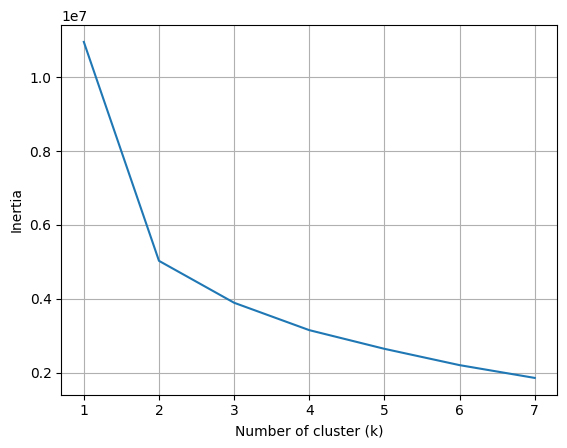

In [ ]:
#K Means Clustering

# Extract relevant columns for geospatial analysis
geo_df = gun_df[['latitude', 'longitude', 'n_killed', 'n_injured','n_guns_involved', 'participant_age_group_numeric','gender_numeric','first_incident_type']]

#Finding the optimal cluster value
inert = []
for k in range(1,8):
    km = KMeans(n_clusters=k, random_state=2)
    km.fit(geo_df)
    inert.append(km.inertia_)

plt.grid(True)
graph = sns.lineplot(x=range(1,8), y=inert)
graph.set(xlabel ="Number of cluster (k)", ylabel = "Inertia")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-278-64941a869d85>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_df['cluster'] = kmeans.fit_predict(X_scaled)


Silhouette Score: 0.311


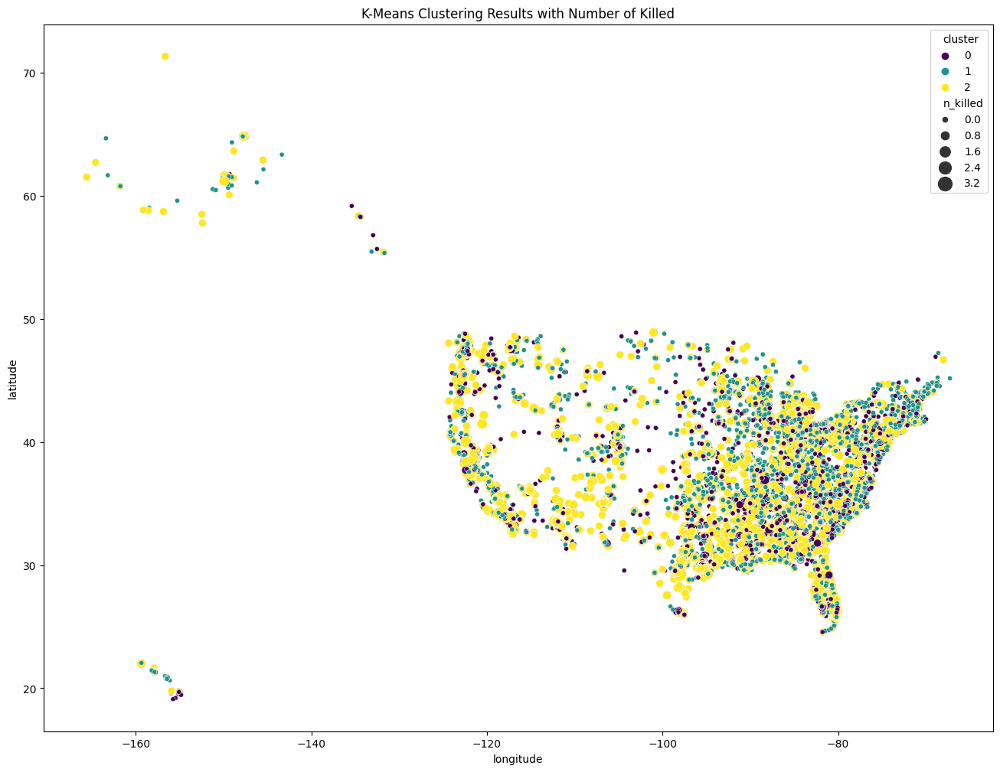

In [ ]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(geo_df)

# Perform KMeans clustering to identify locations with similar characteristics
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
geo_df['cluster'] = kmeans.fit_predict(X_scaled)

# Compute silhouette score
silhouette_avg = silhouette_score(X_scaled, geo_df['cluster'])
print(f'Silhouette Score: {silhouette_avg:.3f}')

plt.figure(figsize=(16, 12))
#sns.scatterplot(x='longitude', y='latitude', hue='cluster', data=geo_df, palette='viridis', legend='full', alpha=0.7)
sns.scatterplot(x='longitude', y='latitude', hue='cluster', size='n_killed', sizes=(20, 200), data=geo_df, palette='viridis')
plt.title('K-Means Clustering Results with Number of Killed')
plt.show()




A silhouette score of 0.32 suggests that the clusters are reasonably well-defined, but there is still some overlap between clusters. The score is positive, indicating that, on average, data points are closer to members of their own cluster than to members of other clusters.

In [ ]:
# Analyze characteristics of each cluster
cluster_characteristics = geo_df.groupby('cluster').mean()

# Print the characteristics of each cluster
print("Cluster Characteristics:")
print(cluster_characteristics)

# Extract incident types and demographic factors for each cluster
cluster_incident_types = {}
cluster_demographic_factors = {}

for cluster_id in range(num_clusters):
    # Filter data for the current cluster
    cluster_data = geo_df[geo_df['cluster'] == cluster_id]

    # Extract incident types
    incident_types = cluster_data['first_incident_type']
    top_incident_types = incident_types.value_counts().head(5)  # Adjust the number of top incident types as needed
    cluster_incident_types[cluster_id] = top_incident_types

    # Extract demographic factors
    demographic_factors = cluster_data['participant_age_group_numeric'].value_counts()
    top_demographic_factors = demographic_factors.head(5)  # Adjust the number of top demographic factors as needed
    cluster_demographic_factors[cluster_id] = top_demographic_factors

# Print the incident types and demographic factors for each cluster
print("\nTop Incident Types for Each Cluster:")
for cluster_id, incidents in cluster_incident_types.items():
    print(f"Cluster {cluster_id}:")
    print(incidents)

print("\nTop Demographic Factors for Each Cluster:")
for cluster_id, demographics in cluster_demographic_factors.items():
    print(f"Cluster {cluster_id}:")
    print(demographics)

Cluster Characteristics:
          latitude  longitude  n_killed  n_injured  n_guns_involved  \
cluster                                                               
0        37.420268 -88.327512  0.020700   0.803632         1.132717   
1        37.344190 -90.609774  0.000715   0.009763         1.971302   
2        36.686416 -91.101549  0.744073   0.119884         1.148240   

         participant_age_group_numeric  gender_numeric  first_incident_type  
cluster                                                                      
0                             1.099426        0.114327             1.103712  
1                             1.098761        0.055219             7.386466  
2                             1.068756        0.133454             1.846371  

Top Incident Types for Each Cluster:
Cluster 0:
1     14845
6       263
7        36
2        20
10        2
Name: first_incident_type, dtype: int64
Cluster 1:
6     7233
10    3862
7     3429
4      585
5       70
Name: first_in

In [ ]:
print(len(geo_df))

39541


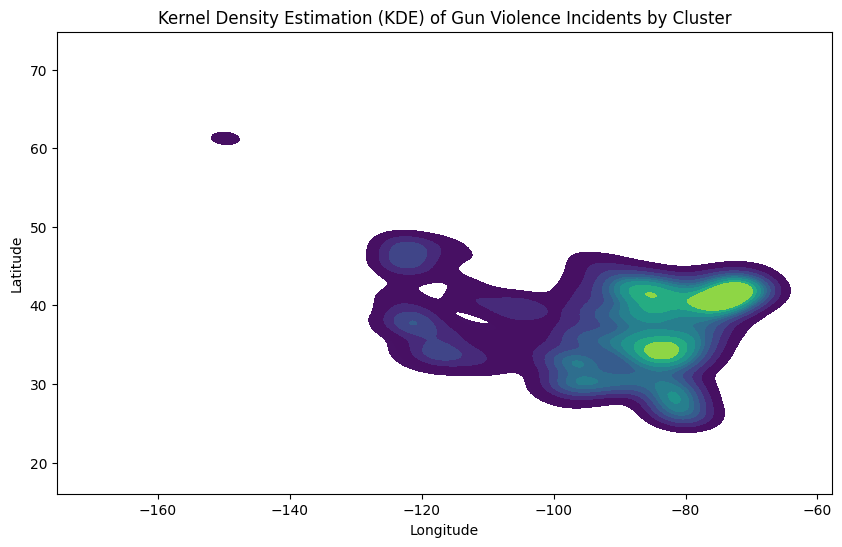

In [ ]:
#plt.figure(figsize=(12, 8))
#sns.kdeplot(x='longitude', y='latitude', hue='n_killed', fill=True, data=gun_df, cmap='viridis')
#plt.title('Kernel Density Estimation of Gun Violence Incidents')
#plt.xlabel('Longitude')
#plt.ylabel('Latitude')
#plt.show()

# KDE plot for the clustered data
plt.figure(figsize=(10, 6))
for cluster_label in geo_df['cluster'].unique():
    sns.kdeplot(
        data=geo_df[geo_df['cluster'] == cluster_label],
        x='longitude',
        y='latitude',
        fill=True,
        cmap='viridis',
        label=f'Cluster {cluster_label}'
    )
plt.title('Kernel Density Estimation (KDE) of Gun Violence Incidents by Cluster')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [ ]:
geo_df = geo_df[:16937]
cluster1 = geo_df[['latitude', 'longitude']][geo_df['cluster'] == 0].values.tolist()
cluster2 = geo_df[['latitude', 'longitude']][geo_df['cluster'] == 1].values.tolist()
cluster3 = geo_df[['latitude', 'longitude']][geo_df['cluster'] == 2].values.tolist()
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4, tiles="openstreetmap")


In [ ]:
for i in cluster1:
    folium.CircleMarker(i, radius=2,color='blue',fill_color='lightblue').add_to(map)

for i in cluster2:
    folium.CircleMarker(i, radius=2,color='red',fill_color='lightred').add_to(map)

for i in cluster3:
    folium.CircleMarker(i, radius=2,color='green',fill_color='lightgreen').add_to(map)

In [ ]:
map

In [ ]:
#DBSCAN

#Optimal Epsilon and number of points
best_score = -1.0
best_epsilon = None
best_min_samples = None
num_clusters = 0
for x in range(1,20):
    epsilon = x/20
    for y in range(5,25,5):
        db = DBSCAN(eps= epsilon, min_samples=y)
        pred_DB = db.fit_predict(X_scaled)
        num_clusters = len(np.unique(pred_DB))
if num_clusters > 1:
    score = silhouette_score(X_scaled, pred_DB)
    if score > best_score:
        best_score = score
        best_epsilon = epsilon
        best_min_samples = y

print('\nDBSCAN CLustering algorithm\nOptimal Epsilon:',best_epsilon)
print('Optimal number of points:', best_min_samples)


DBSCAN CLustering algorithm
Optimal Epsilon: 0.95
Optimal number of points: 20


In [ ]:
print(len(geo_df), len(X_scaled))

16937 39541


<ipython-input-283-7449ccd29509>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_df['cluster'] = db.fit_predict(X_scaled)


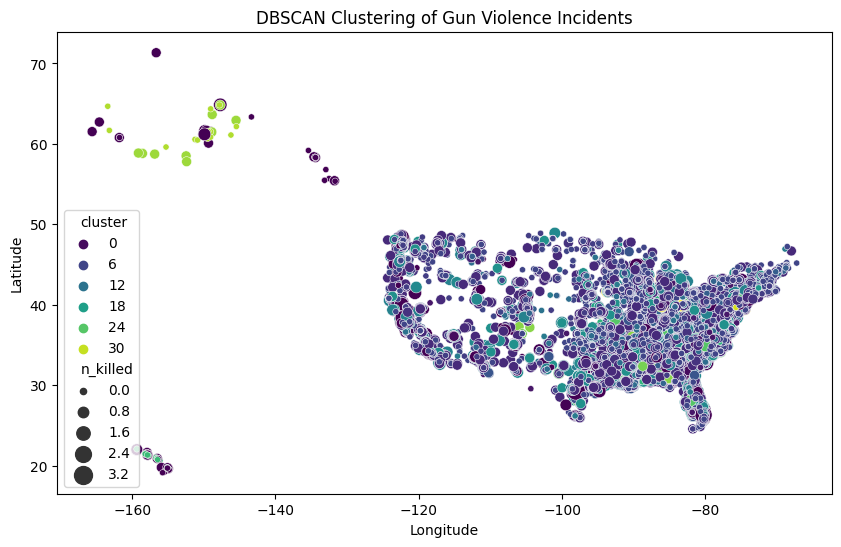

In [ ]:
# Perform DBSCAN clustering with optimal parameters
db = DBSCAN(eps=best_epsilon, min_samples=best_min_samples)
geo_df['cluster'] = db.fit_predict(X_scaled)

# Visualize the clusters
plt.figure(figsize=(10, 6))
#sns.scatterplot(x='longitude', y='latitude', hue='cluster', data=geo_df, palette='viridis', legend='full', alpha=0.7)
sns.scatterplot(x='longitude', y='latitude', hue='cluster', size='n_killed', sizes=(20, 200), data=geo_df, palette='viridis')
plt.title('DBSCAN Clustering of Gun Violence Incidents')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [ ]:
# Calculate silhouette score
silhouette_avg = silhouette_score(X_scaled, geo_df['cluster'])

print(f'Silhouette Score: {silhouette_avg:.3f}')

Silhouette Score: 0.237
